In [2]:
#!pip install pydotplus

In [3]:
#!pip install graphviz
#import sys
#!conda install --yes --prefix {sys.prefix} graphviz

In [2]:
#import os
#os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
#os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

'D:\\anaconda3;D:\\anaconda3\\Library\\mingw-w64\\bin;D:\\anaconda3\\Library\\usr\\bin;D:\\anaconda3\\Library\\bin;D:\\anaconda3\\Scripts;D:\\anaconda3\\bin;D:\\anaconda3\\condabin;C:\\windows\\system32;C:\\windows;C:\\windows\\System32\\Wbem;C:\\windows\\System32\\WindowsPowerShell\\v1.0;C:\\windows\\System32\\OpenSSH;C:\\Program Files (x86)\\NVIDIA Corporation\\PhysX\\Common;C:\\Program Files\\NVIDIA Corporation\\NVIDIA NvDLISR;C:\\Program Files (x86)\\Bitvise SSH Client;C:\\WINDOWS\\system32;C:\\WINDOWS;C:\\WINDOWS\\System32\\Wbem;C:\\WINDOWS\\System32\\WindowsPowerShell\\v1.0;C:\\WINDOWS\\System32\\OpenSSH;C:\\ProgramData\\chocolatey\\bin;C:\\Program Files\\OpenSSL\\bin;C:\\Users\\╫ר╫ץ╫¥\\AppData\\Local\\Programs\\Python\\Python38-32\\Scripts;C:\\Users\\╫ר╫ץ╫¥\\AppData\\Local\\Programs\\Python\\Python38-32;C:\\Users\\╫ר╫ץ╫¥\\AppData\\Local\\Microsoft\\WindowsApps;.;C:\\Users\\╫ר╫ץ╫¥\\AppData\\Local\\Programs\\Microsoft VS Code\\bin;D:\\anaconda3\\Library\\bin\\graphviz;D:\\anaconda

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
from scipy.stats import reciprocal, uniform
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split 
from sklearn import metrics  
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import CategoricalNB
from sklearn.linear_model import SGDClassifier 
from pprint import pprint
from sklearn.tree import export_graphviz
from IPython.display import Image  
import pydotplus
import math
from scipy import stats 
from sklearn import svm

# Pre-processing

In [4]:
X = pd.read_csv("./train_processed.csv", index_col=0)
Y = X['subscribed']
X = X.drop('subscribed', axis=1)

In [5]:
def loss_calc(cm):
    return (cm[0][1]*1 + cm[1][0]*15)/sum(sum(cm))

In [63]:
def k_folds(clf,X,y,print_auc= False,threshold=0.5, print_foldnum=False):
    kf = KFold(n_splits=10, shuffle=True, random_state=42) #for cross validation
    k = 0
    cm_list , auc_list,loss_list=[],[],[]
    for train_index, test_index in kf.split(X):
#         k+=1
        if print_foldnum:
            print("------",k,"------")

        # split to train and test
        X_train_cm, X_test_cm = X.iloc[train_index], X.iloc[test_index]
        y_train_cm, y_test_cm = Y.iloc[train_index], Y.iloc[test_index]
        # train the model and make a prediction
        clf.fit(X_train_cm,y_train_cm)
        y_pred_cm = clf.predict(X_test_cm)

        y_probs = clf.predict_proba(X_test_cm) # probability prediction
        y_pred_t=[0 if p[1]<threshold else 1 for p in y_probs]
        cm = metrics.confusion_matrix(y_test_cm, y_pred_t)
        if print_auc:
            fpr, tpr, _ = metrics.roc_curve(y_test_cm, y_probs[:,1])
            auc = metrics.auc(fpr, tpr)
            auc_list.append(auc)
        # save the results
        cm_list.append(cm)
        loss_list.append(loss_calc(cm))
    # print the results
    acc = [(cm[0][0]+cm[1][1])/sum(sum(cm)) for cm in cm_list]
    print("Accuracy: ",  np.mean(acc))
    print("loss per entry: ",  np.mean(loss_list))
    loss=np.mean(loss_list)
    if print_auc:
        print("auc: ",  np.mean(auc_list))
    return  np.mean(acc), loss, X_test_cm, y_test_cm


# Classification

## cross - validation

### simple decision tree
the first model will be a simple decision tree,  train it on the train set and predict the labels to the test set.<br>

In [7]:
# Create Decision Tree classifer object
clf_T = DecisionTreeClassifier(criterion='gini', splitter='best', random_state=42) 

# Train Decision Tree Classifer 
clf_T = clf_T.fit(X,Y)

#cross - validation
acc_simple_tree, loss_simple_tree, x_tree, y_tree=k_folds(clf_T,X,Y)

# Predict the label
#t_Y_pred = clf_T.predict(X_test)

Accuracy:  0.8663044860353459
loss per entry:  1.011760909879364


lets tune the tree: first well look 

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.256447 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.256447 to fit



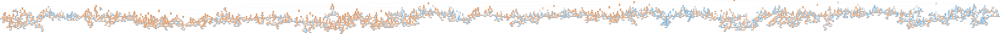

In [8]:
dot = export_graphviz(clf_T, filled=True, rounded=True, 
                special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot)  
graph.write_png('tree1.png')
Image(graph.create_png())

In [9]:
max_features = ['auto', 'log2', 2, 5, 8]
max_depth = [int(x) for x in np.linspace(5, 100, num = 8)]
max_depth.append(None)

min_samples_split = [int(x) for x in np.linspace(math.floor(X.shape[0]/100),(5*math.floor(X.shape[0]/100)),num = 8)]

min_samples_leaf = [int(x) for x in np.linspace(math.floor(X.shape[0]/100),(2*math.floor(X.shape[0]/100)),num = 8)]

splitter='best'
random_grid = {'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
pprint(random_grid)

{'max_depth': [5, 18, 32, 45, 59, 72, 86, 100, None],
 'max_features': ['auto', 'log2', 2, 5, 8],
 'min_samples_leaf': [305, 348, 392, 435, 479, 522, 566, 610],
 'min_samples_split': [305, 479, 653, 827, 1002, 1176, 1350, 1525]}


In [10]:
Tree_random = RandomizedSearchCV(estimator = clf_T, param_distributions = random_grid, n_iter = 200, cv = 5,
                               verbose = 2, random_state = 42, n_jobs = -1)
Tree_random.fit(X,Y)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:   18.9s finished


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'max_depth': [5, 18, 32, 45, 59, 72, 86,
                                                      100, None],
                                        'max_features': ['auto', 'log2', 2, 5,
                                                         8],
                                        'min_samples_leaf': [305, 348, 392, 435,
                                                             479, 522, 566,
                                                             610],
                                        'min_samples_split': [305, 479, 653,
                                                              827, 1002, 1176,
                                                              1350, 1525]},
                   random_state=42, verbose=2)

In [11]:
best_random_simple_tree=Tree_random.best_estimator_
# Predict the label
#t_Y_pred = best_random.predict(X_test)
Tree_random.best_params_

{'min_samples_split': 305,
 'min_samples_leaf': 479,
 'max_features': 2,
 'max_depth': 72}

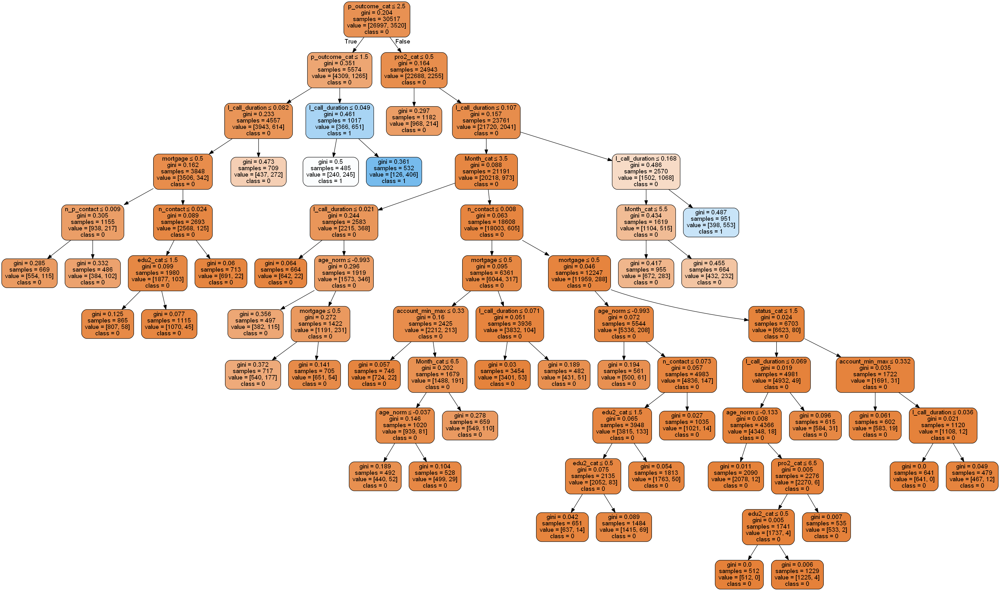

In [12]:
dot = export_graphviz(best_random_simple_tree, filled=True, rounded=True, special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot)  
graph.write_png('tree2.png')
Image(graph.create_png())

In [13]:
#check
temppred = best_random_simple_tree.predict(X)
pd.DataFrame(metrics.confusion_matrix(Y, temppred))

,0,1
0,26233,764
1,2316,1204


In [14]:
acc_random_simple_tree,loss_random_simple_tree, x_simple_tree, y_simple_tree =k_folds(Tree_random.best_estimator_,X,Y,print_auc=True)

Accuracy:  0.894190289757392
loss per entry:  1.3462977138750458
auc:  0.8527442193713691


Improvement of 3.22%.


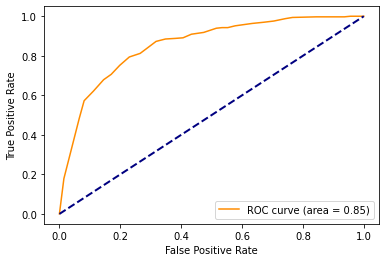

In [15]:
print('Improvement of {:0.2f}%.'.format( 100 * (acc_random_simple_tree - acc_simple_tree) / acc_simple_tree))

#calculationg for the decision tree
y_probs_d = best_random_simple_tree.predict_proba(x_simple_tree) # probability prediction
fpr_d, tpr_d, _ = metrics.roc_curve(y_simple_tree, y_probs_d[:,1])
auc_d = metrics.auc(fpr_d, tpr_d)
plt.figure()
plt.plot(fpr_d, tpr_d, color='darkorange', label='ROC curve (area = %0.2f)' %  auc_d)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

In [16]:
clf_T_weight = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=7 ,class_weight={0:1,1:15}, random_state=42) 

# Train Decision Tree Classifer 
clf_T_weight = clf_T_weight.fit(X,Y)

#cross - validation
acc_simple_tree_weight, loss_simple_tree_weight,x_simple_tree_weight, y_simple_tree_weight=k_folds(clf_T,X,Y)

Accuracy:  0.8663044860353459
loss per entry:  1.011760909879364


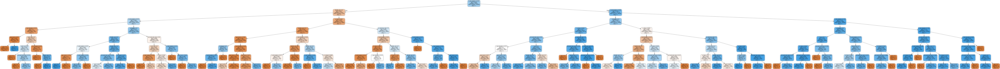

In [17]:
dot = export_graphviz(clf_T_weight, filled=True, rounded=True, 
                special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot)  
graph.write_png('tree3.png')
Image(graph.create_png())

In [18]:
# # Train Decision Tree Classifer 
# best_random_simple_tree = best_random_simple_tree.fit(X,Y)
threshold=(1/(1+15))
#cross - validation
acc_random_simple_tree_weight, loss_random_simple_tree_weight,x_random_simple_tree_weight, y_random_simple_tree_weight=k_folds(best_random_simple_tree,X,Y,threshold=threshold)

Accuracy:  0.6763112173865603
loss per entry:  0.5218721124887399


aaa


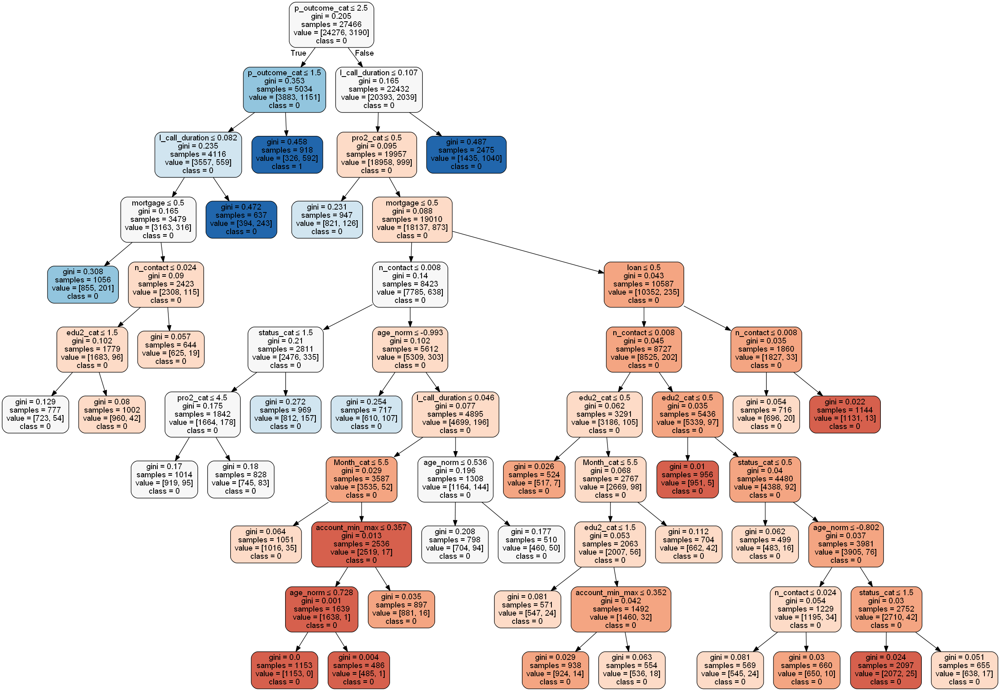

In [19]:
dot = export_graphviz(best_random_simple_tree, filled=True, rounded=True, special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot)
nodes = graph.get_node_list()
#graph.colorscheme()
print('aaa')
for node in nodes:
    if node.get_label():
        values = [int(ii) for ii in node.get_label().split('value = [')[1].split(']')[0].split(',')]
        node.set_colorscheme('rdbu9')
        ratio=values[1]/(values[0]+values[1])
        if ratio>threshold:
            #print('r = ',ratio,' t = ',threshold,' calc = ',int((ratio-threshold)/((1-threshold)/5)+5))
            node.set_fillcolor(min(max(int((ratio-threshold)/(threshold)+5),2),9))#color)
        else:
            node.set_fillcolor(min(int((ratio)/((threshold/5))+2),4))#color)
        #node.set_fillcolor(9)
graph.write_png('tree2.png')
Image(graph.create_png())


### stochastic gradient descent model
next well implement the stochastic gradient descent model which is a faster type of gradient descent
Hyperparameter:
- loss: the function being minimized
- alpha:a coeficient ment to deal overfitting and make the model more flexiable
- learning rate: the weight assosiated with each tree in the final conclusion 
- n_estimators: number of trees created
- eta0= the initial learning rate which will remain constant if the learning rate equate "constant"

In [58]:
loss = ['log', 'modified_huber', 'squared_hinge'] 
max_iter=[500, 1000]
penalty = ['l1', 'l2', 'elasticnet'] 
alpha = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100] 
learning_rate = ['constant', 'optimal', 'invscaling'] 
class_weight = [{0:1, 1:15}]
eta0 = [0.3, 0.5, 1, 10, 100] 
param_distributions = dict(loss=loss, 
    penalty=penalty, 
    alpha=alpha, 
    learning_rate=learning_rate, 
    class_weight=class_weight, 
    eta0=eta0) 

sgd = SGDClassifier(loss="log", penalty="l2", max_iter=1000)
acc_sgd, loss_sgd,X_test_cm_sgd, Y_test_cm_sgd=k_folds(sgd,X,Y)

random_sto = RandomizedSearchCV(estimator=sgd, 
    param_distributions=param_distributions, 
    scoring='roc_auc', 
    verbose=1, n_jobs=-1, 
    n_iter=1000) 
random_result = random_sto.fit(X, Y) 
print('Best Score: ', random_result.best_score_) 
print('Best Params: ', random_result.best_params_) 

best_random_sto = random_sto.best_estimator_
acc_random_sto, loss_random_sto, x_random_sto, y_random_sto=k_folds(best_random_sto,X,Y)


Accuracy:  0.8858020789436718
loss per entry:  1.4969024937787623


D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed: 10.4min finished


Best Score:  0.8474104448003839
Best Params:  {'penalty': 'elasticnet', 'loss': 'modified_huber', 'learning_rate': 'optimal', 'eta0': 0.5, 'class_weight': {0: 1, 1: 15}, 'alpha': 0.001}
Accuracy:  0.5987514567769501
loss per entry:  0.6379621789989575


Improvement of -32.41%.


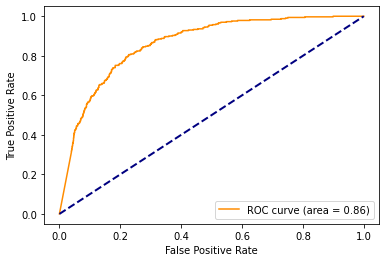

In [59]:
print('Improvement of {:0.2f}%.'.format( 100 * (acc_random_sto - acc_sgd) / acc_sgd))

y_probs_sto = best_random_sto.predict_proba(x_random_sto) # probability prediction
fpr_d, tpr_d, _ = metrics.roc_curve(y_random_sto, y_probs_sto[:,1])
auc_d = metrics.auc(fpr_d, tpr_d)
plt.figure()
plt.plot(fpr_d, tpr_d, color='darkorange', label='ROC curve (area = %0.2f)' %  auc_d)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

Accuracy:  0.662447941568263
loss per entry:  0.6696800417369551


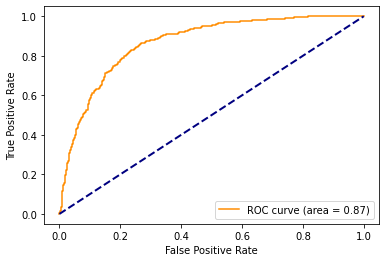

In [60]:
#sgd with weight
sgd_weight = SGDClassifier(loss="log", penalty="l2", max_iter=1000, class_weight={0:1,1:15})
#cross - validation
acc_sgd_weight, loss_sgd_weight,X_test_cm_sgd_weight, Y_test_cm_sgd_weight=k_folds(sgd_weight,X,Y)

y_probs_sgd = sgd_weight.predict_proba(X_test_cm_sgd_weight) # probability prediction
fpr_sgd, tpr_sgd, _ = metrics.roc_curve(Y_test_cm_sgd_weight, y_probs_sgd[:,1])
auc_sgd = metrics.auc(fpr_sgd, tpr_sgd)
plt.figure()
plt.plot(fpr_sgd, tpr_sgd, color='darkorange', label='ROC curve (area = %0.2f)' %  auc_sgd)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

In [64]:
acc_random_sgd_weight, loss_random_sgd_weight, X_test_cm, Y_test_cm =k_folds(random_sto,X,Y,threshold=threshold)

D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed:  8.4min finished
D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed:  8.3min finished
D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 224 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done 474 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 824 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1274 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1824 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 2474 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 3224 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 4074 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed:  8.4min finished
D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   58.2s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed:  8.5min finished
D:\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 945 is smaller than n_iter=1000. Running 945 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 945 candidates, totalling 4725 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 4725 out of 4725 | elapsed:  8.4min finished


Accuracy:  0.3089990334126546
loss per entry:  0.7387079899041982


### Random Forest
lastly we have the random forest model

In [37]:
rf = RandomForestClassifier(random_state = 42,n_jobs=-1)
rf.fit(X, Y)
acc_rf, loss_rf,X_test_cm_rf, Y_test_cm_rf=k_folds(rf,X,Y)
#rf_Y_pred = rf.predict(X_test)

Accuracy:  0.9035622250487882
loss per entry:  1.0914887283158778


In [ ]:
#pd.DataFrame(metrics.confusion_matrix(Y_test, rf_Y_pred))

In [38]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]

max_features = ['auto', 'log2', 2, 5, 8]

max_depth = [int(x) for x in np.linspace(5, 100, num = 10)]
max_depth.append(None)


min_samples_split = [int(x) for x in np.linspace(math.floor(X.shape[0]/100),(5*math.floor(X.shape[0]/100)),num = 8)]

min_samples_leaf = [int(x) for x in np.linspace(math.floor(X.shape[0]/100),(2*math.floor(X.shape[0]/100)),num = 8)]



max_samples = [0.1, 0.3, 0.5, 0.7, 0.9]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_samples': max_samples}
pprint(random_grid)

{'max_depth': [5, 15, 26, 36, 47, 57, 68, 78, 89, 100, None],
 'max_features': ['auto', 'log2', 2, 5, 8],
 'max_samples': [0.1, 0.3, 0.5, 0.7, 0.9],
 'min_samples_leaf': [305, 348, 392, 435, 479, 522, 566, 610],
 'min_samples_split': [305, 479, 653, 827, 1002, 1176, 1350, 1525],
 'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]}


In [39]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 200, cv = 5,
                               verbose = 2, random_state = 42, n_jobs = -1)

rf_random.fit(X, Y)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 19.6min finished


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'max_depth': [5, 15, 26, 36, 47, 57, 68,
                                                      78, 89, 100, None],
                                        'max_features': ['auto', 'log2', 2, 5,
                                                         8],
                                        'max_samples': [0.1, 0.3, 0.5, 0.7,
                                                        0.9],
                                        'min_samples_leaf': [305, 348, 392, 435,
                                                             479, 522, 566,
                                                             610],
                                        'min_samples_split': [305, 479, 653,
                                                              827, 1002, 1176,
                                       

Accuracy:  0.8979913446078097
loss per entry:  1.3273594953935135
Improvement of -0.62%.


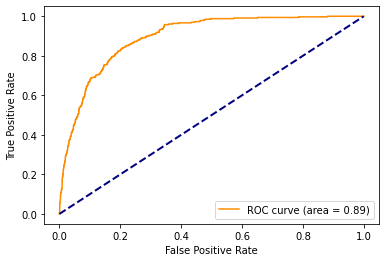

In [40]:
acc_rf_random, loss_rf_random,X_test_cm_rf_random, Y_test_cm_rf_random=k_folds(rf_random.best_estimator_,X,Y)

print('Improvement of {:0.2f}%.'.format( 100 * (acc_rf_random - acc_rf) / acc_rf))

best_rf_random = rf_random.best_estimator_

y_probs_rf = best_rf_random.predict_proba(X_test_cm_rf_random) # probability prediction
fpr_rf, tpr_rf, _ = metrics.roc_curve(Y_test_cm_rf_random, y_probs_rf[:,1])
auc_rf = metrics.auc(fpr_rf, tpr_rf)
plt.figure()
plt.plot(fpr_rf, tpr_rf, color='darkorange', label='ROC curve (area = %0.2f)' %  auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

In [41]:
rf_weight = RandomForestClassifier(random_state = 42,n_jobs=-1,class_weight={0:1,1:15})
rf_weight.fit(X, Y)
acc_rf_weight, loss_rf_weight,X_test_cm_rf_weight, Y_test_cm_rf_weight=k_folds(rf_weight,X,Y)

Accuracy:  0.9012028370476044
loss per entry:  1.2250529551576885


In [42]:
threshold=(1/(1+15))
#cross - validation
acc_random_rf_weight, loss_random_rf_weight,X_test_cm_random_rf_weight, Y_test_cm_random_rf_weight=k_folds(best_rf_random,X,Y,threshold=threshold)

Accuracy:  0.6408893502463365
loss per entry:  0.4279240031736581


### Naive Bayes classifier 

well add the naive bayes classifier to get some basic comparable results

In [43]:
clf_bg = GaussianNB()
clf_bg.fit(X, Y)
acc_clf_bg, loss_clf_bg, X_clf_bg, Y_clf_bg=k_folds(clf_bg,X,Y)
print('Improvement of threshold')
acc_clf_bg, loss_clf_bg, X_clf_bg, Y_clf_bg=k_folds(clf_bg,X,Y,threshold=threshold)
#bg_Y_pred = clf_bg.predict(X_test)

Accuracy:  0.8368128340706891
loss per entry:  1.00409449365161
Improvement of threshold
Accuracy:  0.5292779090112045
loss per entry:  0.6413809815916659


###  Gradient Boosting Classifier

In [44]:
from sklearn.ensemble import GradientBoostingClassifier

In [45]:
gboosting_clf = GradientBoostingClassifier(n_estimators=100, random_state=0)

parameters_gboost = {
    "n_estimators":[30,70,100,150,200,250],
    "max_depth":[5,6,7,8,9],
    "learning_rate":[0.1,0.15,0.2,0.25,0.3,0.35,0.4,1]
}

gboost_random = RandomizedSearchCV(estimator = gboosting_clf, param_distributions = parameters_gboost, n_iter = 125, cv = 5,
                               verbose = 2, random_state = 42, n_jobs = -1)
gboost_random.fit(X, Y)
acc_gboost_random, loss_gboost_random, X_gboost_random, Y_gboost_random=k_folds(gboost_random.best_estimator_,X,Y,threshold=threshold)


Fitting 5 folds for each of 125 candidates, totalling 625 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   27.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 625 out of 625 | elapsed: 17.7min finished


Accuracy:  0.7601670358814956
loss per entry:  0.3531456394633305


In [46]:
acc_gboost_random, loss_gboost_random, X_gboost_random, Y_gboost_random=k_folds(gboost_random.best_estimator_,X,Y,threshold=threshold)


Accuracy:  0.7601670358814956
loss per entry:  0.3531456394633305


### svm model
next well implement the svm model
Hyperparameter:
- C: Regularization, a smaller value of C creates a small-margin hyperplane and a larger value of C creates a larger-margin hyperplane.
- Kernel: The function that used to transform the original training data into a higher dimension.

In [255]:
#check c
clf_svm = svm.SVC(kernel='rbf', C=50,gamma='auto', probability=True)
clf_svm.fit(X, Y)

#cross - validation
acc_svm, loss_svm, x_svm, y_svm=k_folds(clf_svm,X,Y)

#svm_Y_pred = clf_svm.predict(X_test)
#svm_acu = metrics.accuracy_score(Y_test, svm_Y_pred)

Accuracy:  0.8963858829775854
loss per entry:  1.2922595904572034


### Comparison between the classifiers:
now lets compare results:

In [65]:
clf_list = [clf_T_weight,sgd_weight, best_random_sto, best_random_simple_tree, best_rf_random, clf_bg, gboost_random.best_estimator_]
thresholds=[0.5,0.5,0.5,threshold,threshold,threshold,threshold]
cm_dict, auc_dict = {}, {}
kf = KFold(n_splits=10, shuffle=True, random_state=42) #for cross validation
k = 0
for train_index, test_index in kf.split(X):
    k+=1
    print("------",k,"------")
    
    # split to train and test
    X_train_cm, X_test_cm = X.iloc[train_index], X.iloc[test_index]
    y_train_cm, y_test_cm = Y.iloc[train_index], Y.iloc[test_index]
    j =-1
    for clf in clf_list:
        j+=1
        # train the model and make a prediction
        clf.fit(X_train_cm,y_train_cm)
       
        y_probs = clf.predict_proba(X_test_cm) # probability prediction
        y_pred_t=[0 if p[1]<thresholds[j] else 1 for p in y_probs]
        cm = metrics.confusion_matrix(y_test_cm, y_pred_t)
        fpr, tpr, _ = metrics.roc_curve(y_test_cm, y_probs[:,1])
        auc = metrics.auc(fpr, tpr)
        # save the results
        cm_list = cm_dict.get(clf,[])
        cm_list.append(cm)
        cm_dict[clf] = cm_list
        auc_list = auc_dict.get(clf,[])
        auc_list.append(auc)
        auc_dict[clf] = auc_list
        # print the results
        print("Classifier: ", clf)
        print("loss: ", loss_calc(cm))

------ 1 ------
Classifier:  DecisionTreeClassifier(class_weight={0: 1, 1: 15}, max_depth=7, random_state=42)
loss:  0.4518348623853211
Classifier:  SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
loss:  0.5956749672346002
Classifier:  SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
loss:  0.6205766710353866
Classifier:  DecisionTreeClassifier(max_depth=72, max_features=2, min_samples_leaf=479,
                       min_samples_split=305, random_state=42)
loss:  0.5753604193971167
Classifier:  RandomForestClassifier(max_depth=15, max_features=8, max_samples=0.9,
                       min_samples_leaf=392, min_samples_split=827,
                       n_estimators=200, n_jobs=-1, random_state=42)
loss:  0.45445609436435125
Classifier:  GaussianNB()
loss:  0.6277850589777195
Classifier:  GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
loss:  0.381389252948886
------ 2 ------
Class

Classifier:  RandomForestClassifier(max_depth=15, max_features=8, max_samples=0.9,
                       min_samples_leaf=392, min_samples_split=827,
                       n_estimators=200, n_jobs=-1, random_state=42)
loss:  0.4388725008194035
Classifier:  GaussianNB()
loss:  0.6794493608652901
Classifier:  GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
loss:  0.373320222877745
------ 10 ------
Classifier:  DecisionTreeClassifier(class_weight={0: 1, 1: 15}, max_depth=7, random_state=42)
loss:  0.415929203539823
Classifier:  SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
loss:  0.6057030481809242
Classifier:  SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
loss:  0.4850868567682727
Classifier:  DecisionTreeClassifier(max_depth=72, max_features=2, min_samples_leaf=479,
                       min_samples_split=305, random_state=42)
loss:  0.4975417895771878
Classifier:  RandomFor

In [66]:
acc_dict = {}
prec_dict = {}
for clf in clf_list:
    print(clf)
    loss = [loss_calc(cm) for cm in cm_dict[clf]]
    acc_dict[clf] = loss
    print("mean loss: ", np.mean(loss))

DecisionTreeClassifier(class_weight={0: 1, 1: 15}, max_depth=7, random_state=42)
mean loss:  0.43274189155694387
SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
mean loss:  0.6249984535504548
SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
mean loss:  0.5556224180199175
DecisionTreeClassifier(max_depth=72, max_features=2, min_samples_leaf=479,
                       min_samples_split=305, random_state=42)
mean loss:  0.5218721124887399
RandomForestClassifier(max_depth=15, max_features=8, max_samples=0.9,
                       min_samples_leaf=392, min_samples_split=827,
                       n_estimators=200, n_jobs=-1, random_state=42)
mean loss:  0.4279240031736581
GaussianNB()
mean loss:  0.6413809815916659
GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
mean loss:  0.3531456394633305


In [67]:
#compare sgd_weight with naive bayes
ttest,pval = stats.ttest_rel(acc_dict[sgd_weight], acc_dict[clf_bg])
print("p-value:" , pval)
if pval<0.05:
    print("reject null hypothesis")
else:
    print("accept null hypothesis")

p-value: 0.4233535372147008
accept null hypothesis


In [68]:
#compare all with gboost_random.best_params_
clf_list = [sgd_weight, best_random_sto,clf_bg]
for clf in clf_list:
    print(str(clf))
    ttest,pval = stats.ttest_rel(acc_dict[gboost_random.best_estimator_], acc_dict[clf])
    print("p-value:" , pval)
    if pval<0.05:
        print("reject null hypothesis")
    else:
        print("accept null hypothesis")

SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
p-value: 1.5351419735441508e-07
reject null hypothesis
SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
p-value: 4.526473300597897e-08
reject null hypothesis
GaussianNB()
p-value: 1.4949765964262033e-09
reject null hypothesis


In [69]:
#compare all with tree threshold
clf_list = [sgd_weight, best_random_sto,clf_bg,gboost_random.best_estimator_]
for clf in clf_list:
    print(str(clf))
    ttest,pval = stats.ttest_rel(acc_dict[clf_T_weight], acc_dict[clf])
    print("p-value:" , pval)
    if pval<0.05:
        print("reject null hypothesis")
    else:
        print("accept null hypothesis")

SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
p-value: 4.142970436105449e-06
reject null hypothesis
SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
p-value: 1.779507016349664e-05
reject null hypothesis
GaussianNB()
p-value: 7.3759062955839574e-09
reject null hypothesis
GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
p-value: 2.424180859224069e-06
reject null hypothesis


In [70]:
#compare all with tree weight 
clf_list = [best_random_simple_tree,sgd_weight, best_random_sto,clf_bg,gboost_random.best_estimator_]
for clf in clf_list:
    print(str(clf))
    ttest,pval = stats.ttest_rel(acc_dict[clf_T_weight], acc_dict[clf])
    print("p-value:" , pval)
    if pval<0.05:
        print("reject null hypothesis")
    else:
        print("accept null hypothesis")

DecisionTreeClassifier(max_depth=72, max_features=2, min_samples_leaf=479,
                       min_samples_split=305, random_state=42)
p-value: 2.6616294757141784e-05
reject null hypothesis
SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
p-value: 4.142970436105449e-06
reject null hypothesis
SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
p-value: 1.779507016349664e-05
reject null hypothesis
GaussianNB()
p-value: 7.3759062955839574e-09
reject null hypothesis
GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
p-value: 2.424180859224069e-06
reject null hypothesis


In [71]:
#compare all with best_rf_random 
clf_list = [clf_T_weight,best_random_simple_tree,sgd_weight, best_random_sto,clf_bg,gboost_random.best_estimator_]
for clf in clf_list:
    print(str(clf))
    ttest,pval = stats.ttest_rel(acc_dict[best_rf_random], acc_dict[clf])
    print("p-value:" , pval)
    if pval<0.05:
        print("reject null hypothesis")
    else:
        print("accept null hypothesis")

DecisionTreeClassifier(class_weight={0: 1, 1: 15}, max_depth=7, random_state=42)
p-value: 0.4242408518694596
accept null hypothesis
DecisionTreeClassifier(max_depth=72, max_features=2, min_samples_leaf=479,
                       min_samples_split=305, random_state=42)
p-value: 1.742055661663145e-06
reject null hypothesis
SGDClassifier(class_weight={0: 1, 1: 15}, loss='log')
p-value: 5.775868488984824e-06
reject null hypothesis
SGDClassifier(alpha=0.001, class_weight={0: 1, 1: 15}, eta0=0.5,
              loss='modified_huber', penalty='elasticnet')
p-value: 8.129384974913321e-06
reject null hypothesis
GaussianNB()
p-value: 7.98346635130302e-09
reject null hypothesis
GradientBoostingClassifier(max_depth=6, n_estimators=30, random_state=0)
p-value: 4.008607421428948e-08
reject null hypothesis


בחירת המסווג הטוב ביותר

In [142]:
real_t = pd.read_csv("./test_processed.csv", index_col=0)
y_probs = best_rf_random.predict_proba(real_t) # probability prediction
y_pred_t=[0 if p[1]<threshold else 1 for p in y_probs]
real_t['subscribed'] = y_pred_t
real_t.to_csv('predictions.csv')